In [7]:
import math
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import torch
from torch.utils.data import DataLoader
from datasets import ModelnetDataset, ShapenetDataset
from transforms import SetRotation
from pointnet import PointNetCls

In [8]:
# use filter to only include airplane and chair datasets
modelnet_train = ModelnetDataset(filter=2)
modelnet_test = ModelnetDataset(filter=2, test=True)
modelnet_train_loader = DataLoader(modelnet_train, batch_size=32, shuffle=True, num_workers=2)
modelnet_test_loader = DataLoader(modelnet_test, batch_size=32, shuffle=True, num_workers=2)

In [9]:
# load target model which needs to be explained
model = PointNetCls.load_from_drive(PointNetCls, name='pointnet')

In [10]:
def zzip(a, b):
    if len(a) == 0:
        if len(b) == 0:
            return []
        else:
            return b
    if len(b) == 0:
        return a
    return [a[0], b[0]] + zzip(a[1:], b[1:])

def unstack(t):
    return [x.squeeze(0) for x in list(t.split(1))]

In [11]:
Colormap=['r', 'b']
def subplot_num(m, i, j):
    return i*m + j

def draw_pc(ax, pc, color=None):
    pc = SetRotation((np.pi/2, -np.pi, 0))(pc)
    X, Y, Z = np.split(pc, 3)
    ax.scatter(X, Y, Z, c=color)
    ax.set_axis_off()

def plot_samples(samples, n, m, save=False, savename='pclouds', Model=None):
    fig = plt.figure(figsize=(4.5*m,4.5*n))
    fig.set_tight_layout(True)
    for i in range(n):
        for j in range(m):
            idx = subplot_num(m, i, j)
            ax = fig.add_subplot(n, m, idx+1, projection='3d', xticks=[], yticks=[], zticks=[])
            if Model is not None:
                pre = Model(torch.from_numpy(samples[idx]).unsqueeze(0))
#                 print(pre[0].shape)
                
                
                prob0 = str(round(np.exp(pre[0].detach().numpy())[0][0],4))
                prob1 = str(round(np.exp(pre[0].detach().numpy())[0][1],4))
                title =classname[pre[0].argmax(axis = 1).numpy()[0]]
                
#                 ax.title.set_text("predicted label: " + title + '\n' + "airplane: " + prob0 + '\n' + "chair: " + prob1)
                
                if j == 5:
                    ax.set_title("airplane: " + prob0 + '\n' + "chair: " + prob1, fontsize=30, fontweight='bold')
                else:
                    ax.set_title("airplane: " + prob0 + '\n' + "chair: " + prob1, fontsize=30)
                draw_pc(ax, samples[idx], color=Colormap[pre[0].argmax(axis = 1).numpy()[0]])
#                 draw_pc(ax, samples[idx], color='g')
            else:
                draw_pc(ax, samples[idx])
    if save:
        plt.savefig(savename, bbox_inches='tight', pad_inches=0)
    plt.show()
def plot_samples2(samples, n, m, save=False, savename='pclouds', Model=None):
    fig = plt.figure(figsize=(4.5*m,4.5*n))
    fig.set_tight_layout(True)
    for i in range(n):
        for j in range(m):
            idx = subplot_num(m, i, j)
            ax = fig.add_subplot(n, m, idx+1, projection='3d', xticks=[], yticks=[], zticks=[])
            if Model is not None:
                pre = Model(torch.from_numpy(samples[idx]).unsqueeze(0))
#                 print(pre[0].shape)
                
                
                prob0 = str(round(np.exp(pre[0].detach().numpy())[0][0],3))
                prob1 = str(round(np.exp(pre[0].detach().numpy())[0][1],3))
                title =classname[pre[0].argmax(axis = 1).numpy()[0]]
                
#                 ax.title.set_text("predicted label: " + title + '\n' + "airplane: " + prob0 + '\n' + "chair: " + prob1)
                
                
                if i ==5 and j == 5:
                    ax.set_title("Prob: " + prob0 + '/' + prob1 + "\n" + "Dis: " + "[" + str(i*4-20) + ","+ str(j*4-20)+ "]", fontsize=30, fontweight='bold')
                else:
                    ax.set_title("Prob: " + prob0 + '/' + prob1+ "\n" + "Dis: " + "[" + str(i*4-20) + ","+ str(j*4-20)+ "]", fontsize=30)
                
                draw_pc(ax, samples[idx], color=Colormap[pre[0].argmax(axis = 1).numpy()[0]])
#                 draw_pc(ax, samples[idx], color='g')
            else:
                draw_pc(ax, samples[idx])
    if save:
        plt.savefig(savename, bbox_inches='tight', pad_inches=0)
    plt.show()

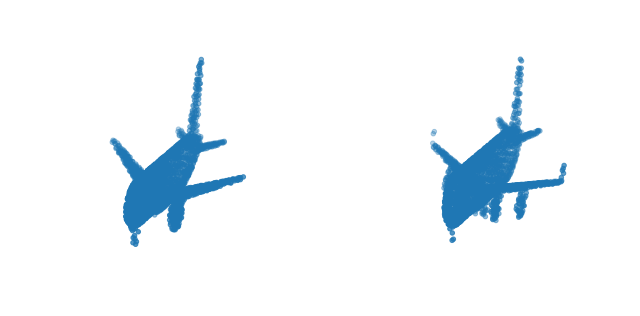

In [12]:
# display two samples in training dataset
batch, _ = next(iter(modelnet_train_loader))
test = batch[[0,1]]
plot_samples(test, 1, 2)

In [15]:
pre,_,_ = model(test)
pre

tensor([[-0.0145, -4.2420],
        [-0.0120, -4.4281]], grad_fn=<LogSoftmaxBackward>)

In [16]:
classname = ['airplane','chair']
classname[pre.argmax(axis = 1).numpy()[0]]

'airplane'

In [17]:
classname[pre.argmax(axis = 1).numpy()[1]]

'airplane'

In [18]:
# helper function for confusion matrix visualization
from sklearn.metrics import confusion_matrix
import itertools
plt.rcParams['figure.figsize'] = [10,7]

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [23]:
model.eval()
probs, truth = [], []
for x, y in modelnet_train_loader:
    truth.append(y)
    prob,_,_ = model(x)
    probs.append(prob.argmax(axis = 1))
    
probs = torch.cat(probs, dim=0)
truth = torch.cat(truth, dim=0)


In [24]:
cm = confusion_matrix(truth.numpy(), probs.numpy())

Confusion matrix, without normalization


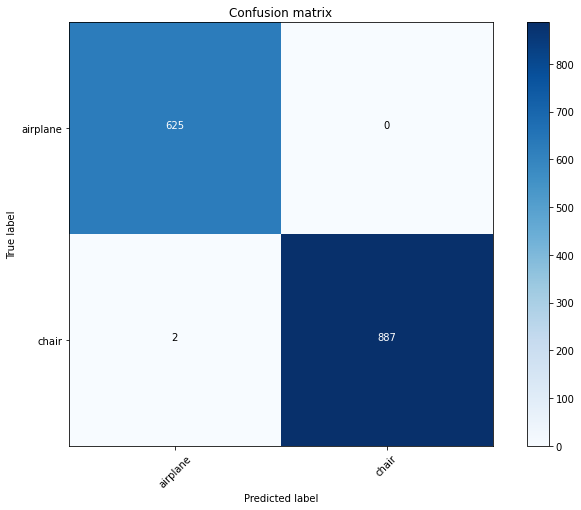

In [25]:
plot_confusion_matrix(cm, classes = classname)

In [27]:
#find the two mispredicted chairs 
ture =1
false = 0
false_example = []
for x, y in modelnet_train:
    if len(false_example)==2:
        break
    if y==ture:
        proba,_,_ = model(x.unsqueeze(0))
        proba = proba.argmax(axis = 1)
        if proba == false and len(false_example)<=2:
            false_example.append(x)
   

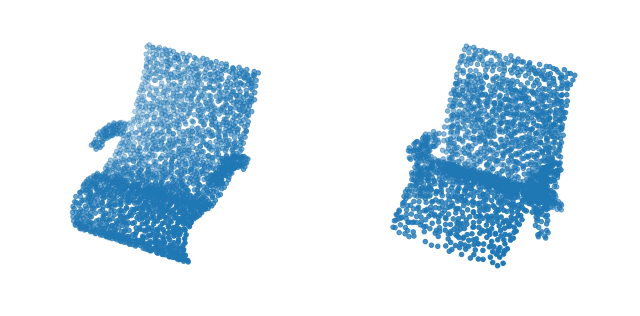

In [28]:
plot_samples(false_example, 1, 2)

In [19]:
# #pick example of given label
# def pick_exmaple(label):
#     for x, y in modelnet_train:
#         if y == label:
#             return x

In [20]:
# airplane_example = []
# chair_example = []
# airplane_example.append(pick_exmaple(0))
# chair_example.append(pick_exmaple(1))
                     

In [21]:
# plot_samples(airplane_example, 1, 1)
# plot_samples(chair_example, 1, 1)

In [30]:
from vae import NPCVAE
model_VAE = NPCVAE.load_from_drive(NPCVAE, name='normal_pcvae')

The size of the pointnet output is torch.Size([1, 1024])
The size of the encoder output is torch.Size([1, 256])


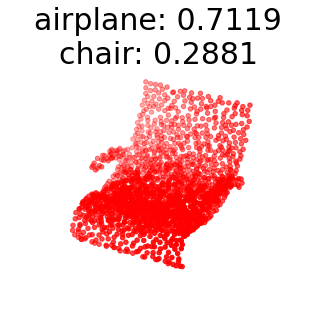

In [41]:
# reconstruct the mispredicted chairs using trained VAE
out = model_VAE(false_example[0].unsqueeze(0))
plot_samples(out[0].detach().numpy(), 1, 1, Model=model)

The size of the pointnet output is torch.Size([1, 1024])
The size of the encoder output is torch.Size([1, 256])


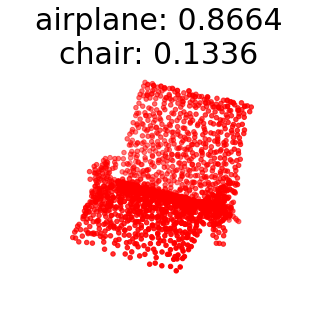

In [42]:
out = model_VAE(false_example[1].unsqueeze(0))
plot_samples(out[0].detach().numpy(), 1, 1, Model=model)

In [43]:
# get the latent space
hidden1,_,_ = model_VAE.encode(false_example[0].unsqueeze(0))

The size of the pointnet output is torch.Size([1, 1024])
The size of the encoder output is torch.Size([1, 256])


In [34]:
hidden1.shape

torch.Size([1, 128])

In [44]:
hidden2,_,_ = model_VAE.encode(false_example[1].unsqueeze(0))

The size of the pointnet output is torch.Size([1, 1024])
The size of the encoder output is torch.Size([1, 256])


In [45]:
hidden1 = hidden1.squeeze()
hidden2 = hidden2.squeeze()

In [46]:
latent_dim = 128
def find_possible_hidden(s_encoded, limit=20):
    change_list = []
    for dim_num in range(latent_dim):
        move = 0.1
        step = 0.1
        while True:
            change = torch.zeros((1, latent_dim))
            change[0, dim_num] = move
            z_sample = s_encoded + change
            decoded = model_VAE.decoder(z_sample).view(3,-1)
            pre = model(decoded.unsqueeze(0))
            label = pre[0].argmax(axis = 1).numpy()[0]
#                 print(pre[0].shape)
#           reverse    
            z_sample_r = s_encoded - change
            decoded_r = model_VAE.decoder(z_sample_r).view(3,-1)
            pre_r = model(decoded_r.unsqueeze(0))
            label_r = pre_r[0].argmax(axis = 1).numpy()[0]    
            
            
            if move>limit:
                change_list.append(move)
                break
            if label!=1 and label_r!=1:
                move+=step
            else:
                change_list.append(move)
                break
    return change_list

In [53]:
# second example, sorting the demensions using Algorithm 1
changelist2 = find_possible_hidden(hidden2)
idx2= np.argsort(changelist2)

#  Refine neiborhood by displaying first 20 dimensions
### We evaluate the 3D PointNet model using generated sample manifolds. 
### The middle column are the generated airplane that corresponding the originals, 
### Then we disturb the first 20 dimensions to generate its neighbors
### The red color represents the class airplane and vice-versa for the blue color

In [54]:

morph_alld2 = []
h = 0
for k in idx2:
    if h == 20:
        break
    i = 0
    h = h + 1
    move = -20
    while i<11:
        change = torch.zeros((1,latent_dim))
        change[0, k] = move
        hidden = hidden2 + change
        x_decoded = model_VAE.decoder(hidden).view(3,-1)
        morph_alld2.append(x_decoded.detach().numpy())
        move = move + 4
        i = i + 1


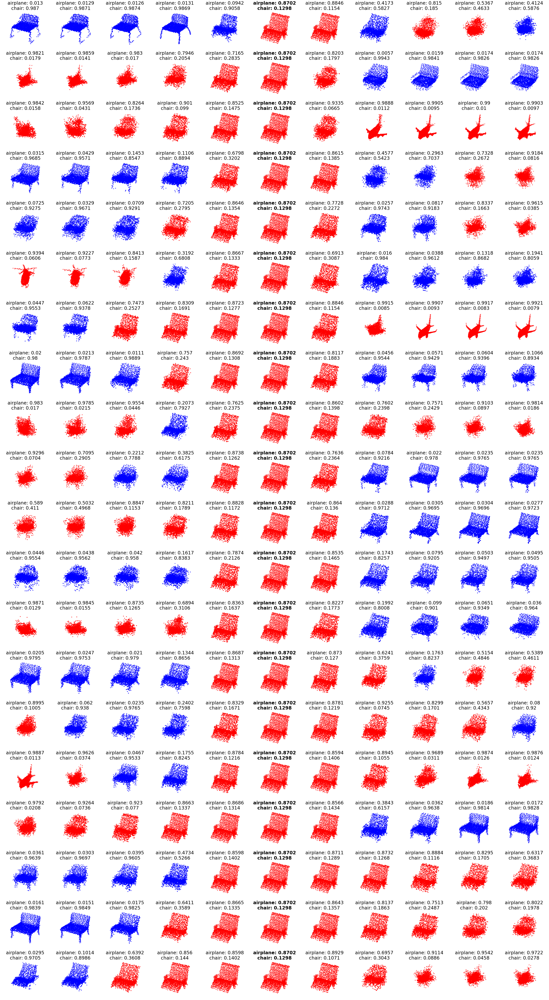

In [55]:
plot_samples( morph_alld2, 20, 11, Model=model, save=True)

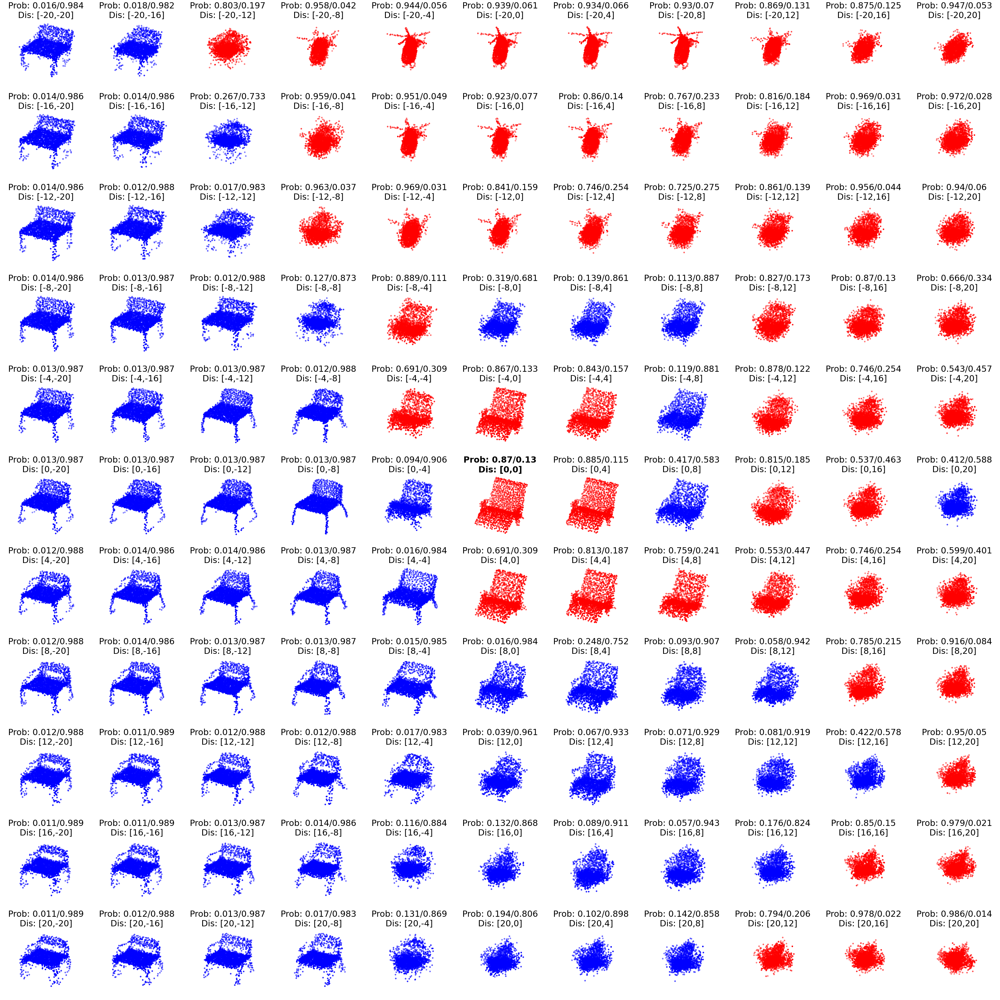

In [57]:
# manually pick two dimensions to explain the target model using the manifold sample matrix
# zoom in first and sixth dimensions to see the behavior change on manifolds along the decision boundary.
# The centriod is the reconstructed cooresponding to the orignal 
morph_2d2 = []

d1 = idx2[0]
d2 = idx2[5]
move1, move2 = -20, -20
while move2 <= 20:
    move1 = -20
    while move1 <= 20:
        change = torch.zeros((1,latent_dim))
        change[0, d1] = move1
        change[0, d2] = move2
        hidden = hidden2 + change
        x_decoded = model_VAE.decoder(hidden).view(3,-1)
        morph_2d2.append(x_decoded.detach().numpy())
        move1 = move1 + 4
    move2 = move2 + 4
plot_samples2( morph_2d2, 11, 11, Model=model, save=True)

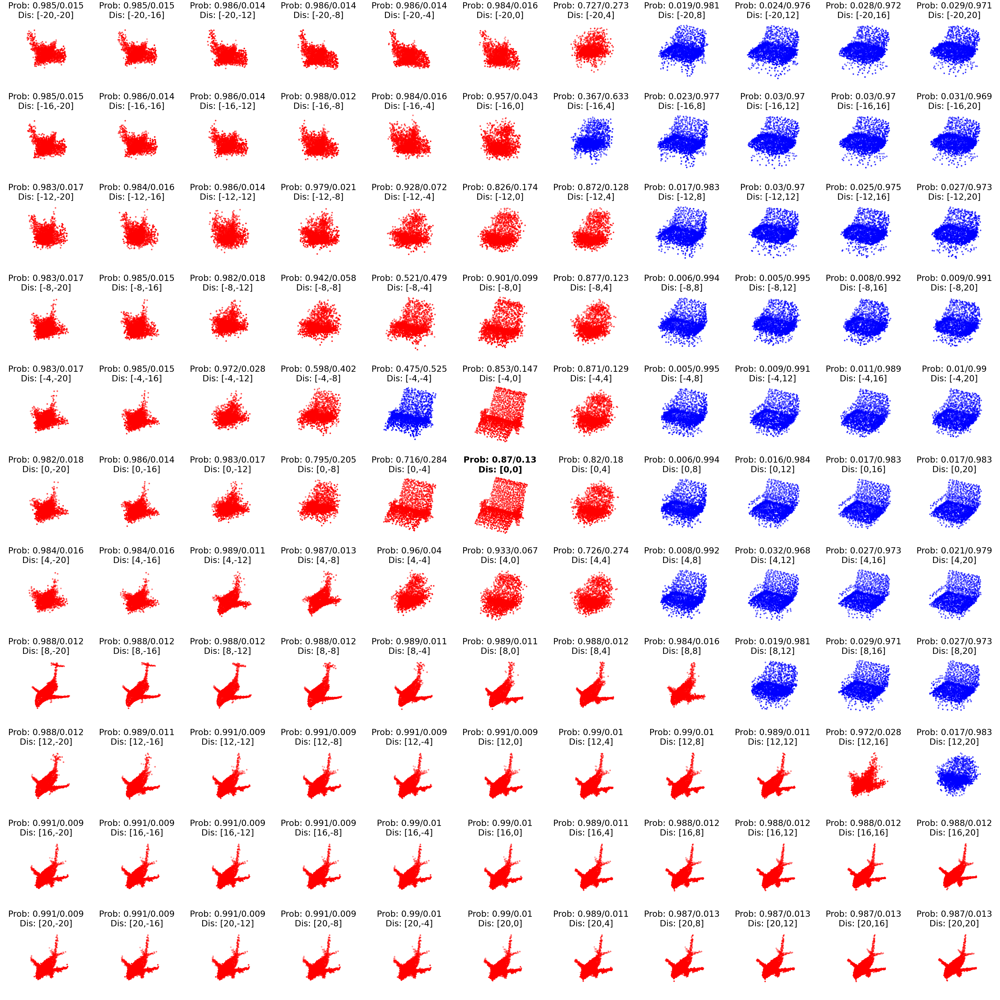

In [58]:
# zoom in second and third dimensions
morph_2d2 = []
d1 = idx1[1]
d2 = idx1[2]
move1, move2 = -20, -20
while move2 <= 20:
    move1 = -20
    while move1 <= 20:
        change = torch.zeros((1,latent_dim))
        change[0, d1] = move1
        change[0, d2] = move2
        hidden = hidden2 + change
        x_decoded = model_VAE.decoder(hidden).view(3,-1)
        morph_2d2.append(x_decoded.detach().numpy())
        move1 = move1 + 4
    move2 = move2 + 4
plot_samples2( morph_2d2, 11, 11, Model=model, save=True)